# StyleGAN latent space exploration

## Install dependencies

In [1]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
# %rm -rf /content/some

In [ ]:
!pip install ninja
!pip install imageio-ffmpeg
!pip install -U -q PyDrive
!pip install lpips
!pip install pytorch_msssim
!pip install pytorch-ignite


from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

%mkdir raw_images
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch
%cd stylegan2-ada-pytorch
!git clone https://github.com/denkogit/stylegan2_models


!mkdir pretrained_models
%cd pretrained_models
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
!wget https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat.bz2

file_id = '1cUv_reLE6k3604or78EranS7XzuVMWeO' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('e4e_ffhq_encode.pt')

%cd ..
# ref https://github.com/Puzer/stylegan-encoder/blob/master/align_images.py
# !git clone https://github.com/omertov/encoder4editing


## Download images and vectors

In [3]:
file_id = '1WoiQmg7k-XKYSVNMvAZm_QUqAo_gK5uE' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('/content/celebs.zip')

file_id = '10zYE9lkYq6SuMVL0MaTv4YSuwdg_Wbhg' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('/content/editing.zip')

In [ ]:
!unzip /content/celebs.zip -d /content/
!unzip /content/editing.zip -d /content/
! rm -rf /content/__MACOSX

In [ ]:
!unzip /content/celebas.zip -d /content/
!unzip /content/styles.zip -d /content/
!unzip /content/expressions.zip -d /content/

In [6]:
!rm -rf /content/celebas/.DS_Store
!rm -rf /content/styles/.DS_Store
!rm -rf /content/expressions/.DS_Store

In [7]:
! rm -rf /content/__MACOSX

## Align images

In [8]:
import os
from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector


landmarks_model_path = "/content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "/content/celebas"
ALIGNED_IMAGES_DIR = "/content/aligned_images"

landmarks_detector = LandmarksDetector(landmarks_model_path)
for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

In [13]:
RAW_IMAGES_DIR = "/content/styles"
ALIGNED_IMAGES_DIR = "/content/aligned_styles"

landmarks_detector = LandmarksDetector(landmarks_model_path)
os.makedirs(ALIGNED_IMAGES_DIR, exist_ok=True)
for i, img_name in enumerate(os.listdir(RAW_IMAGES_DIR)):
  raw_img_path = os.path.join(RAW_IMAGES_DIR, img_name)
  for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
      aligned_face_path = os.path.join(ALIGNED_IMAGES_DIR, f"{i}.jpg")
      image_align(raw_img_path, aligned_face_path, face_landmarks)
      break

In [14]:
RAW_IMAGES_DIR = "/content/expressions"
ALIGNED_IMAGES_DIR = "/content/aligned_expressions"

landmarks_detector = LandmarksDetector(landmarks_model_path)
os.makedirs(ALIGNED_IMAGES_DIR, exist_ok=True)
for i, img_name in enumerate(os.listdir(RAW_IMAGES_DIR)):
  raw_img_path = os.path.join(RAW_IMAGES_DIR, img_name)
  for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
      aligned_face_path = os.path.join(ALIGNED_IMAGES_DIR, f"{i}.jpg")
      image_align(raw_img_path, aligned_face_path, face_landmarks)
      break

# StyleGAN face generation

## StyleGAN face generation

In [9]:
import os
os.chdir("/content/stylegan2-ada-pytorch")
print(os.getcwd())


/content/stylegan2-ada-pytorch


In [10]:
import pickle

seed = 2345645
noise_mode = 'const' # шум
label = 0 # для разных моделей
device = "cuda:0"
model_path = "/content/stylegan2-ada-pytorch/pretrained_models/ffhq.pkl"

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

In [11]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# image = ((image * std) + mean)
def plot_image(tensor, plot_size=(10,10)):
  tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  plt.rcParams["figure.figsize"] = plot_size
  plt.imshow(img)


def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)


## Truncation


truncation - интерполяция в сторону среднего вектора



In [12]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F



# https://pypi.org/project/pytorch-msssim/
class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss


# https://pypi.org/project/lpips/
class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg')
        self.lpips_loss.to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))


# https://github.com/NVlabs/stylegan2-ada-pytorch/blob/main/projector.py#L104
class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self,):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss

# image = (image - mean) / std
def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor


def find_latent(inv_img_path: str):

    # загружаем изображение
    target_pil = Image.open(inv_img_path).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)

    # инициализируем функции потерь
    lpips_loss = Lpips_loss(device)
    rec_loss = Rec_loss()

    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
    reg_loss = Reg_loss(noise_bufs)

    #  loss weights
    regularize_noise_weight = 5e5
    rec_weight = 0.5
    lpips_weoght = 1.0

    # Параметры для оптимизации
    num_steps = 150
    seed = 42
    initial_learning_rate = 0.05
    w_avg_samples = 10000

    target_uint8 = np.array(target_pil, dtype=np.uint8)


    # Получаем средний вектор латентного пространства
    num_steps = 100
    learning_rate = 0.01
    initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

    optimizer = torch.optim.Adam([initial_latent_vector], lr=learning_rate)

    for step in tqdm(range(num_steps)):
      synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

      lpips_value = lpips_loss(synth_tensor, target_tensor)
      rec_value = rec_loss(synth_tensor, target_tensor)
      reg_value = reg_loss()

      loss = lpips_value*lpips_weoght + rec_value*rec_weight + reg_value*regularize_noise_weight

      optimizer.step()
      optimizer.zero_grad(set_to_none=True)
      loss.backward()

    generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)

    return target_tensor, generated_tensor

In [13]:
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms

e4e_model, _ = load_e4e_standalone("/content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt")

image2e4etensor = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize((256, 256)),
                                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])

In [ ]:
root_path = '/content/aligned_images'
target_list, generated_list = list(), list()

for dir_name in os.listdir(root_path):
    im_path = os.path.join(root_path, dir_name, '1.jpg')
    target, generated = find_latent(im_path)

    target_list.append(target)
    generated_list.append(generated)

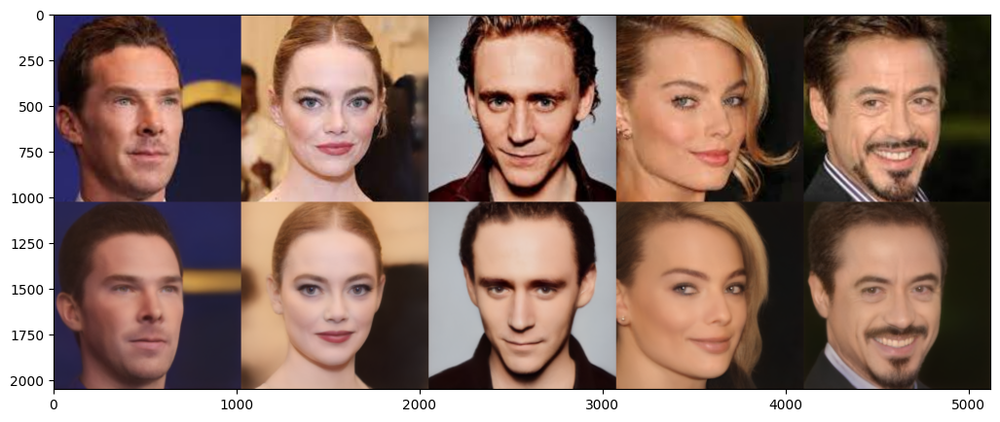

In [21]:
plot_image(torch.cat((torch.cat(target_list, dim=3), torch.cat(generated_list, dim=3)), dim=2), plot_size=(15,5))

## Plot latent using PCA

Метод главных компонент

https://habr.com/ru/post/304214/

In [23]:
import os
import glob
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox



images_path = "/content/aligned_images"
save_path = "/content/e4e_invertion"

data = []
for persone in sorted(os.listdir(images_path)):
    person_images = os.path.join(images_path, persone)
    save_folder = os.path.join(save_path, persone)
    os.makedirs(save_folder, exist_ok=True)

    for image_name in os.listdir(person_images):
      image_path = os.path.join(person_images, image_name)

      target_pil = Image.open(image_path).convert('RGB')
      target_uint8 = np.array(target_pil, dtype=np.uint8)

      e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)

      latent_vector = e4e_model(e4e_tensor).detach().cpu()
      latent_path = os.path.join(save_folder, f"{image_name[:-4]}.pt")

      torch.save(latent_vector, latent_path)
      data.append([persone, image_name, image_path, latent_path])

df = pd.DataFrame(data, columns = ['key', 'image_name', 'image_path', 'latent_path'])

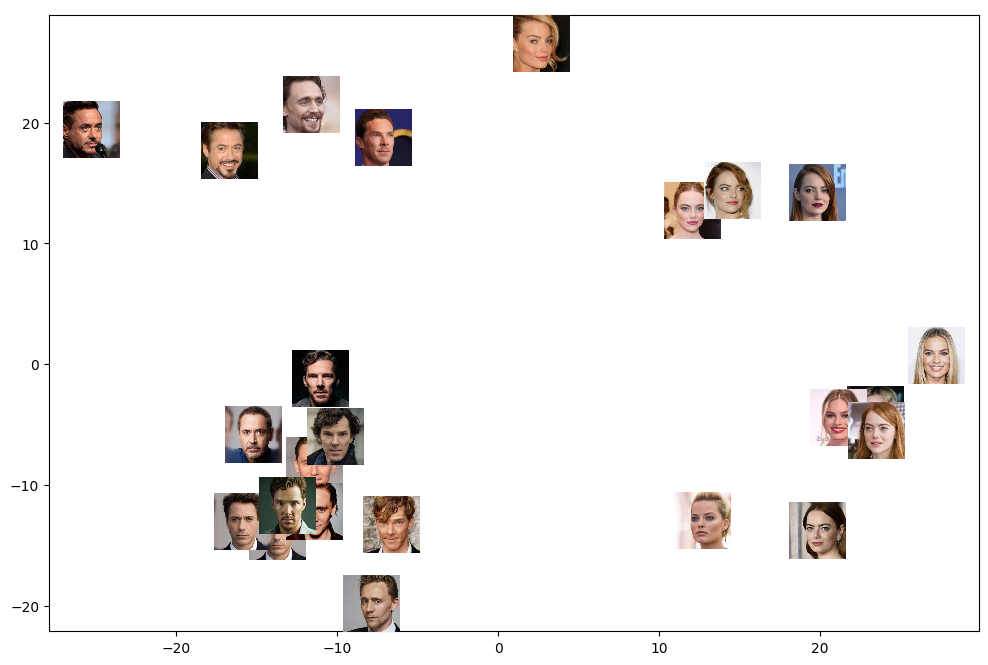

In [24]:
def getImage(path, zoom=0.04):
    return OffsetImage(plt.imread(path), zoom=zoom)

embedings = []
for index, row in df.iterrows():
    latent_path = row["latent_path"]
    latent = torch.load(latent_path).numpy().squeeze(0)
    embedings.append(latent)

batch = np.stack(embedings, axis=0)
batch = batch.reshape((24, 9216))
pca = PCA(n_components=2, random_state=22).fit(batch)
x = pca.transform(batch)

fig, ax = plt.subplots(figsize=(12,8))
# for x, y, path in zip(x[:, 0], x[:, 1], df.image_path.values.tolist()):
for x, y, df_iter in zip(x[:, 0], x[:, 1], df.iterrows()):
  i, row = df_iter
  path = row["image_path"]
  label = row["key"]
  ab = AnnotationBbox(getImage(path), (x, y), frameon=False)
  ax.add_artist(ab)
  plt.scatter(x,y, label=label)

# plt.legend()
plt.show()




In [33]:
images_path = "/content/aligned_styles"
save_path = "/content/e4e_invertion_styles"

os.makedirs(save_path, exist_ok=True)

for image_name in os.listdir(images_path):
    image_path = os.path.join(images_path, image_name)

    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)

    latent_vector = e4e_model(e4e_tensor).detach().cpu()
    latent_path = os.path.join(save_path, f"{image_name[:-4]}.pt")

    torch.save(latent_vector, latent_path)


In [135]:
images_path = "/content/aligned_expressions"
save_path = "/content/e4e_invertion_expressions"

os.makedirs(save_path, exist_ok=True)

for image_name in os.listdir(images_path):
    image_path = os.path.join(images_path, image_name)

    target_pil = Image.open(image_path).convert('RGB')
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)

    latent_vector = e4e_model(e4e_tensor).detach().cpu()
    latent_path = os.path.join(save_path, f"{image_name[:-4]}.pt")

    torch.save(latent_vector, latent_path)


## Style transfer

In [123]:
from IPython.display import display, FileLink
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import torch


def interpolate(latent1, latent2, psi=0.5, indeces=[i for i in range(0,18)]):
    init_latent = latent1.clone()
    latent1 = latent1.clone()
    latent2 = latent2.clone()
    for i in indeces:
        latent1[:, i] = latent2[:, i].lerp(latent1[:, i], psi)

    edited_tensor = G.synthesis(latent1, noise_mode='const', force_fp32=True)
    init_tensor = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    latent2 = G.synthesis(latent2, noise_mode='const', force_fp32=True)
    return init_tensor, edited_tensor, latent2


In [187]:
def transfer_style(root_path, style_path):
    target_list, generated_list, reference_list = list(), list(), list()

    latent2=torch.load(style_path).to(device)

    for dir_name in os.listdir(root_path):
        latent_path = os.path.join(root_path, dir_name, '2.pt')
        latent1=torch.load(latent_path).to(device)

        init, generated, ref = interpolate(latent1, latent2, psi=0, indeces=[ 8, 10, 11, 12, 13, 14, 15, 16, 17])

        target_list.append(init)
        generated_list.append(generated)
        reference_list.append(ref)

    plot_image(torch.cat((torch.cat(reference_list, dim=3), torch.cat(target_list, dim=3), torch.cat(generated_list, dim=3)), dim=2), plot_size=(20,8))


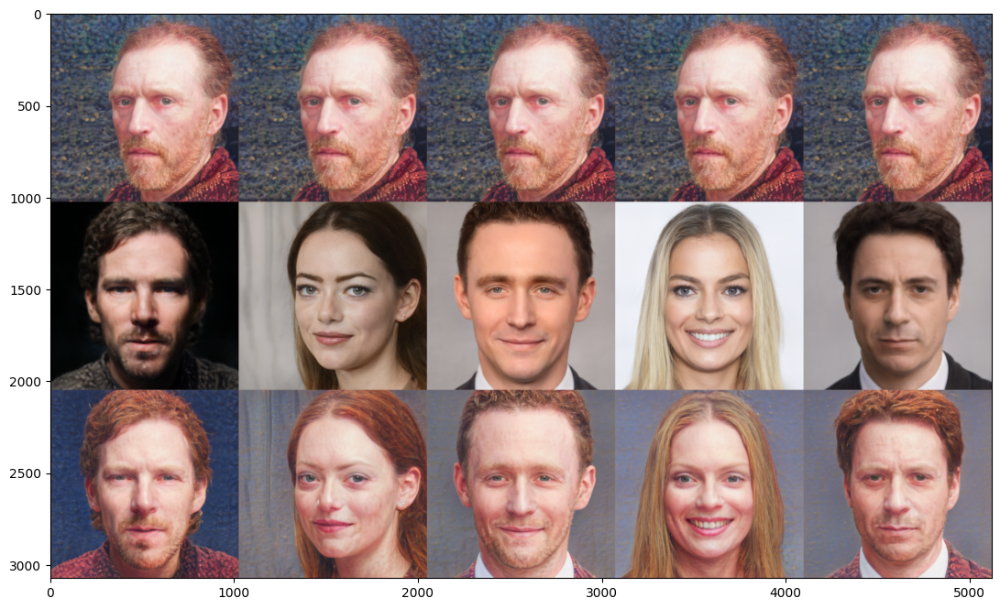

In [188]:
transfer_style('/content/e4e_invertion', "/content/e4e_invertion_styles/0.pt")

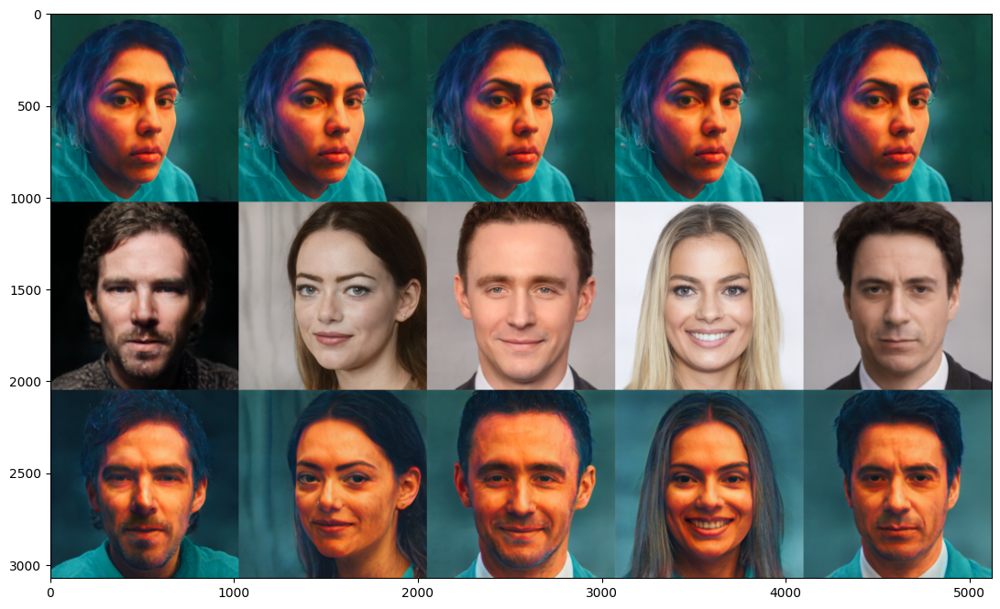

In [189]:
transfer_style('/content/e4e_invertion', "/content/e4e_invertion_styles/1.pt")

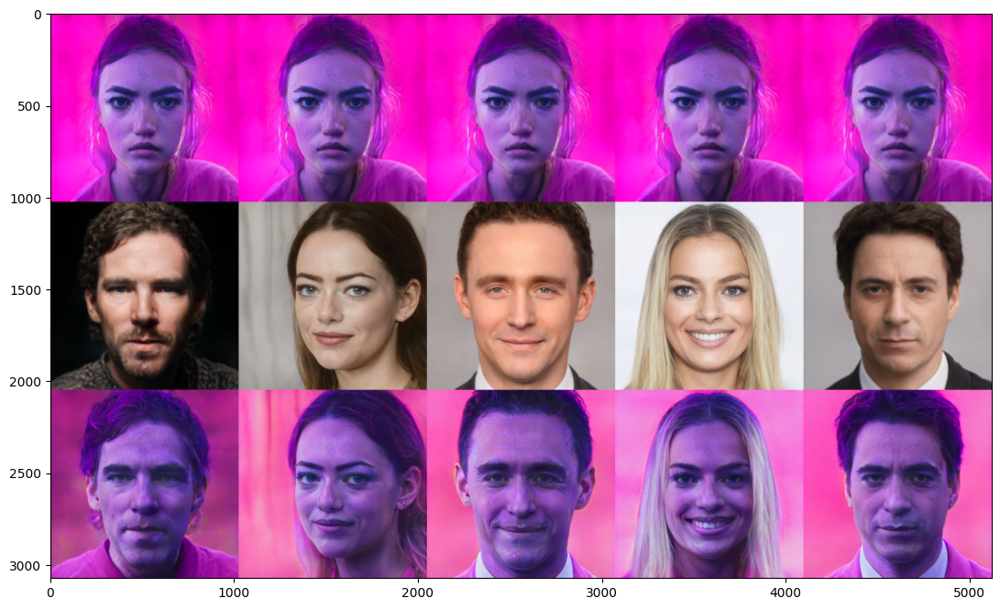

In [190]:
transfer_style('/content/e4e_invertion', "/content/e4e_invertion_styles/2.pt")

## Expression transfer

In [205]:
def transfer_expression(root_path, style_path):
    target_list, generated_list, reference_list = list(), list(), list()

    latent2=torch.load(style_path).to(device)

    for dir_name in os.listdir(root_path):
        latent_path = os.path.join(root_path, dir_name, '2.pt')
        latent1=torch.load(latent_path).to(device)

        init, generated, ref = interpolate(latent1, latent2, psi=0.5, indeces=[0, 1, 4, 5, 6, 7, 9])

        target_list.append(init)
        generated_list.append(generated)
        reference_list.append(ref)

    plot_image(torch.cat((torch.cat(reference_list, dim=3), torch.cat(target_list, dim=3), torch.cat(generated_list, dim=3)), dim=2), plot_size=(20,8))

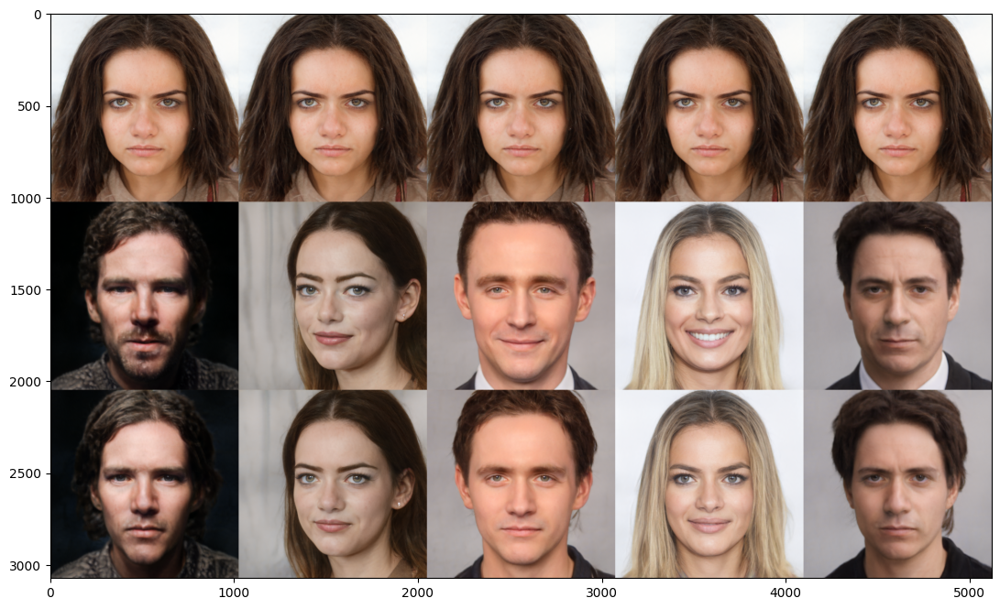

In [206]:
transfer_expression('/content/e4e_invertion', "/content/e4e_invertion_expressions/0.pt")

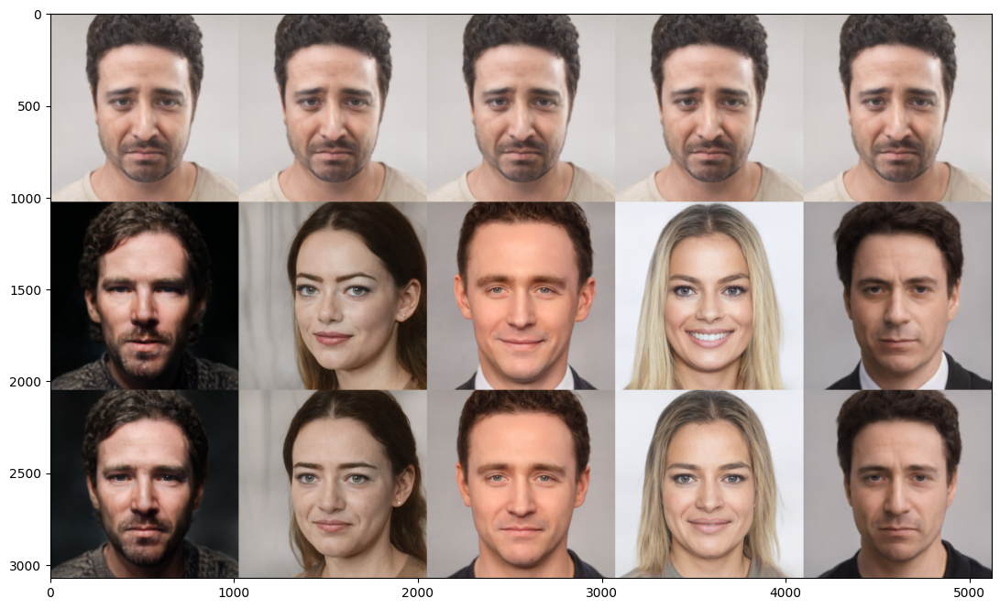

In [207]:
transfer_expression('/content/e4e_invertion', "/content/e4e_invertion_expressions/1.pt")

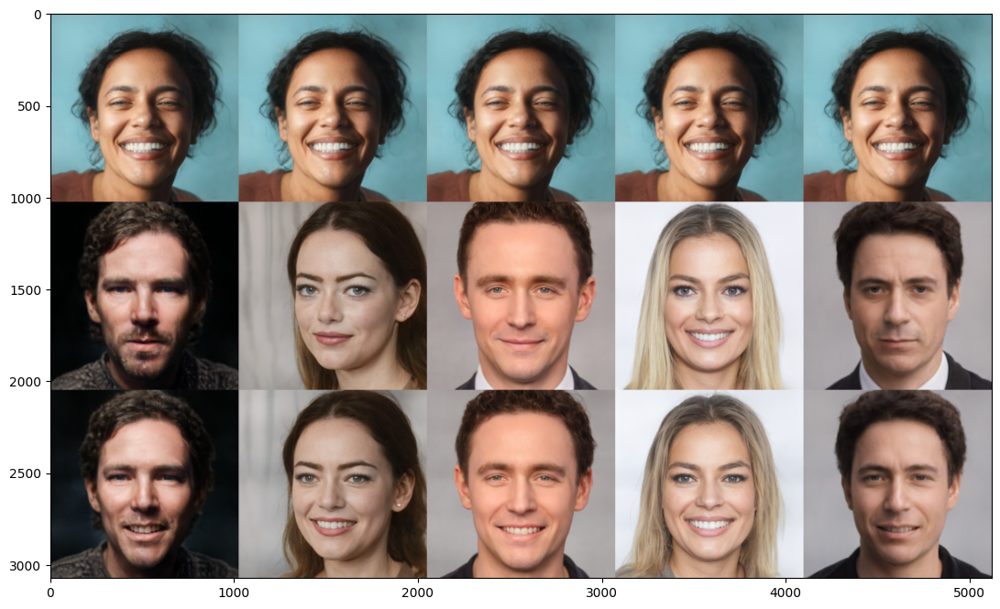

In [208]:
transfer_expression('/content/e4e_invertion', "/content/e4e_invertion_expressions/2.pt")

# Face Swap

In [14]:
file_id = '1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('ms1mv3_arcface_r50_fp16.pth')


In [15]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from stylegan2_models.arcface_model import get_model
import torch.nn.functional as F
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms


def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor


class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, source, synth):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss

# https://drive.google.com/file/d/1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5/view?usp=sharing ссылка на загрузку весов
arcface_path = "/content/stylegan2-ada-pytorch/ms1mv3_arcface_r50_fp16.pth"


In [16]:
def find_latent(inv_img_path: str, swap_path):

    # загружаем изображение
    target_pil = Image.open(inv_img_path).convert('RGB')
    target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)
    target_uint8 = np.array(target_pil, dtype=np.uint8)

    swap_pil = Image.open(swap_path).convert('RGB')
    swap_tensor = image2tensor_norm(swap_pil).to(device).unsqueeze(0)
    swap_uint8 = np.array(swap_pil, dtype=np.uint8)

    e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
    initial_latent_vector = e4e_model(e4e_tensor)


    # инициализируем функции потерь
    lpips_loss = Lpips_loss(device)
    rec_loss = Rec_loss()

    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
    reg_loss = Reg_loss(noise_bufs)
    arc_loss = Arcface_Loss(arcface_path, 'cuda')

    #  loss weights
    regularize_noise_weight = 5e5
    rec_weight = 0.5
    lpips_weight = 1.0
    arcface_weight = 1.5

    # Параметры для оптимизации
    num_steps = 150
    seed = 42
    initial_learning_rate = 0.05
    w_avg_samples = 10000


    # Получаем средний вектор латентного пространства
    num_steps = 100
    learning_rate = 0.01
    initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

    optimizer = torch.optim.Adam([initial_latent_vector], lr=learning_rate)

    for step in tqdm(range(num_steps)):
      optimizer.zero_grad(set_to_none=True)
      synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

      lpips_value = lpips_loss(synth_tensor, target_tensor)
      rec_value = rec_loss(synth_tensor, target_tensor)
      arc_value = arc_loss(synth_tensor, swap_tensor)
      reg_value = reg_loss()

      loss = lpips_value*lpips_weight + arc_value*arcface_weight + rec_value*rec_weight + reg_value*regularize_noise_weight

      loss.backward()
      optimizer.step()


    generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
    torch.cuda.empty_cache()
    return target_tensor, generated_tensor


In [17]:
root_path = '/content/aligned_images'

In [18]:
torch.cuda.empty_cache()

In [ ]:
faces_list = os.listdir(root_path)

container = [[] for i in range(len(faces_list))]

for i, celeba_x in enumerate(faces_list):
  path_x  = os.path.join(root_path, celeba_x, '2.jpg')
  for j, celeba_y in enumerate(faces_list):
    path_y  = os.path.join(root_path, celeba_y, '2.jpg')

    target, generated = find_latent(path_x, path_y)
    torch.cuda.empty_cache()

    container[i].append(generated)

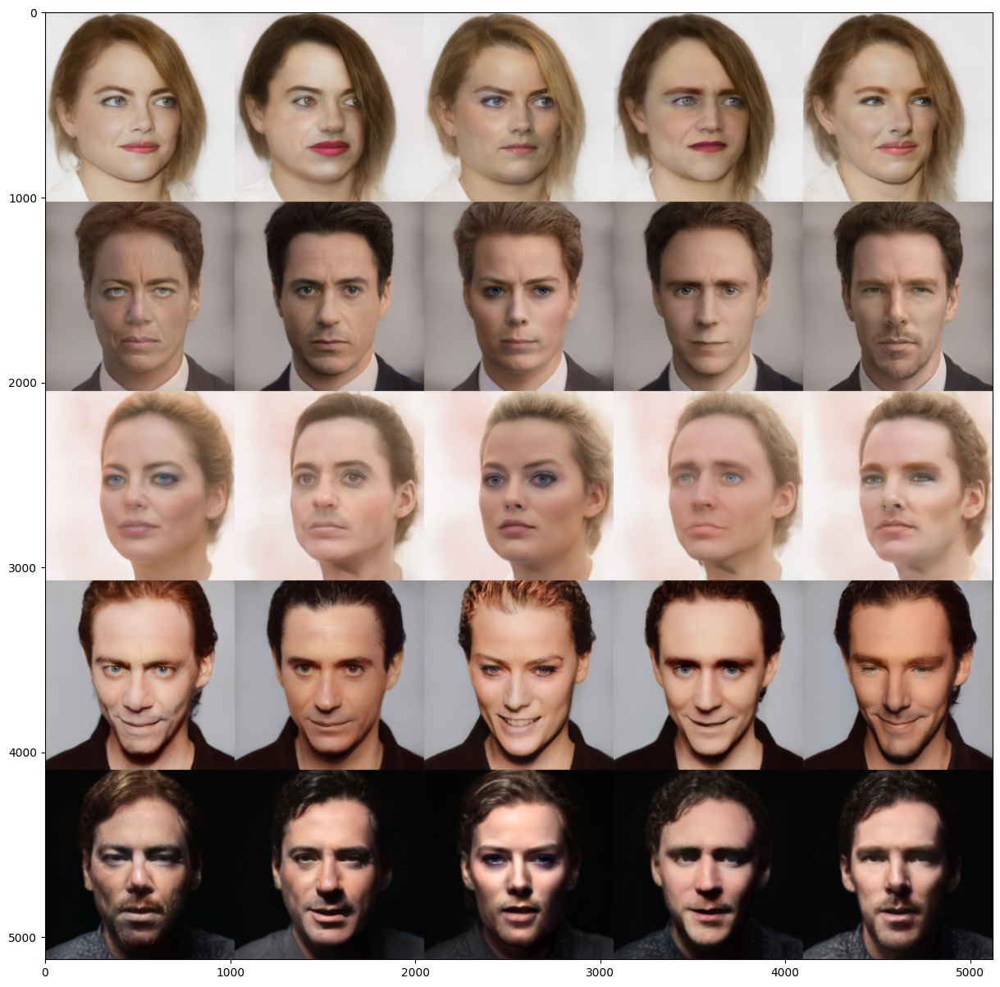

In [24]:
plot_image(torch.cat([torch.cat(container[i], dim=3) for i in range(len(faces_list))], dim=2), plot_size=(15, 15))